In [87]:
import geopandas as gpd
import pandas as pd
import os
from shapely.geometry import Point
from shapely.ops import unary_union, linemerge
from shapely.strtree import STRtree

In [ ]:
BASE_DIR = 'D:/Desktop/mobility-seoul/'  # Change this to your base directory!
URBAN_DIR = os.path.join(BASE_DIR, 'Data/GIS data/Urban cropped/')

seoul_shp = os.path.join(BASE_DIR, 'Data/GIS data/Extents/Seoul extents/seoul_extents.shp')
road_shp = os.path.join(URBAN_DIR, 'roads_seoul.shp')
stations_shp = os.path.join(URBAN_DIR, 'transport_seoul.shp')

road_filter = ['primary', 'secondary', 'tertiary', 'trunk']
station_filter = ['railway_station']
merge_buffer_m = 100

In [89]:
roads_full = gpd.read_file(road_shp).to_crs(epsg=5174)
seoul = gpd.read_file(seoul_shp).to_crs(epsg=5174)
stations = gpd.read_file(stations_shp).to_crs(epsg=5174)

# Main Roads and Stations

In [ ]:
roads = roads_full[roads_full['fclass'].isin(road_filter)]
stations = stations[stations['fclass'].isin(station_filter)]

<Axes: >

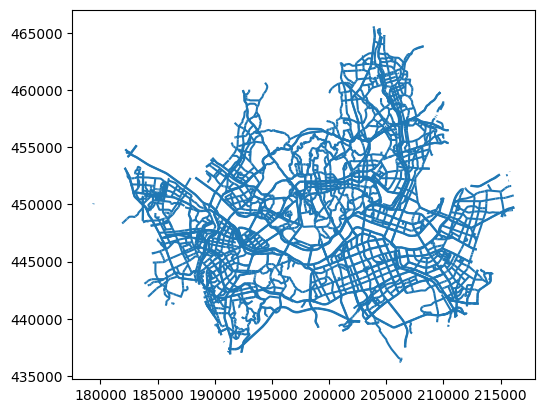

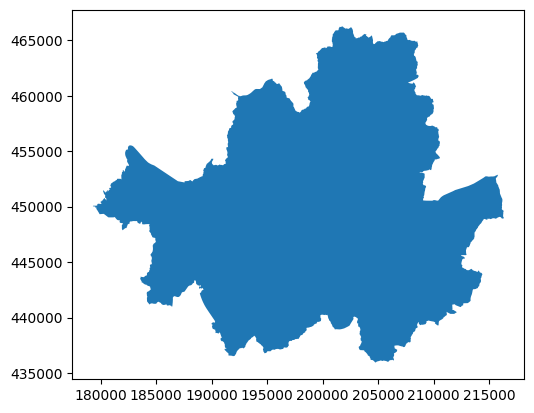

In [91]:
roads.plot()
seoul.plot()

In [92]:
roads_merged = roads.dissolve(by='name')
geoms = list(roads_merged.geometry)
tree = STRtree(geoms)

In [93]:
intersections = []

for geom in geoms:
    candidates = tree.query(geom)
    for candidate in candidates:
        if geom != geoms[candidate]:
            inter = geom.intersection(geoms[candidate])
            if inter.is_empty:
                continue
            if inter.geom_type == 'Point':
                intersections.append(inter)
            elif inter.geom_type.startswith('Multi'):
                intersections.extend([pt for pt in inter.geoms if pt.geom_type == 'Point'])

intersections_gdf = gpd.GeoDataFrame(geometry=intersections, crs=roads_merged.crs)

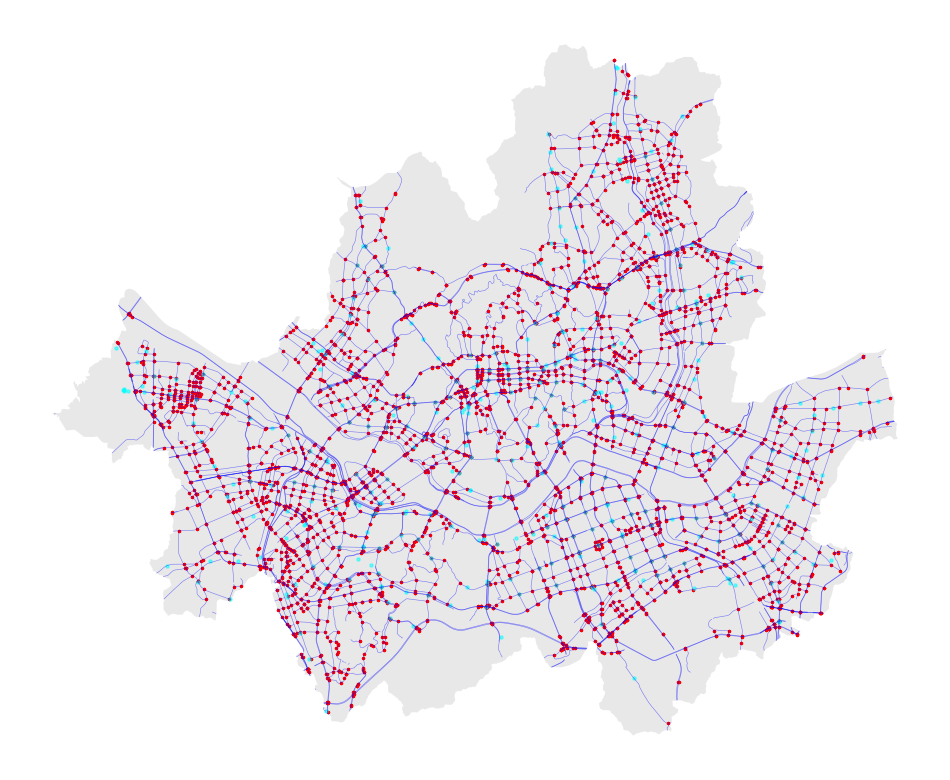

In [94]:
# plot intersections in zoomable plot
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12, 12))
roads_merged.plot(ax=ax, color='blue', alpha=0.5, linewidth=0.4)
seoul.plot(ax=ax, color='lightgrey', alpha=0.5)
intersections_gdf.plot(ax=ax, color='red', markersize=2, alpha=1)
stations.plot(ax=ax, color='cyan', markersize=5, alpha=0.5)
ax.set_axis_off()

In [98]:
from sklearn.cluster import DBSCAN
import numpy as np

# Extract coordinates
coords = np.array([[geom.x, geom.y] for geom in intersections_gdf.geometry])

# Run DBSCAN
db = DBSCAN(eps=merge_buffer_m, min_samples=1, metric='euclidean')  # eps is the distance threshold
cluster_labels = db.fit_predict(coords)

# Assign cluster labels
intersections_gdf['group'] = cluster_labels

# Dissolve to one centroid per group
grouped = intersections_gdf.dissolve(by='group')
grouped['geometry'] = grouped.centroid

# Final output GeoDataFrame
intersections_gdf_final = grouped.reset_index()[['geometry']]
intersections_gdf_final = gpd.GeoDataFrame(intersections_gdf_final, geometry='geometry', crs=intersections_gdf.crs)

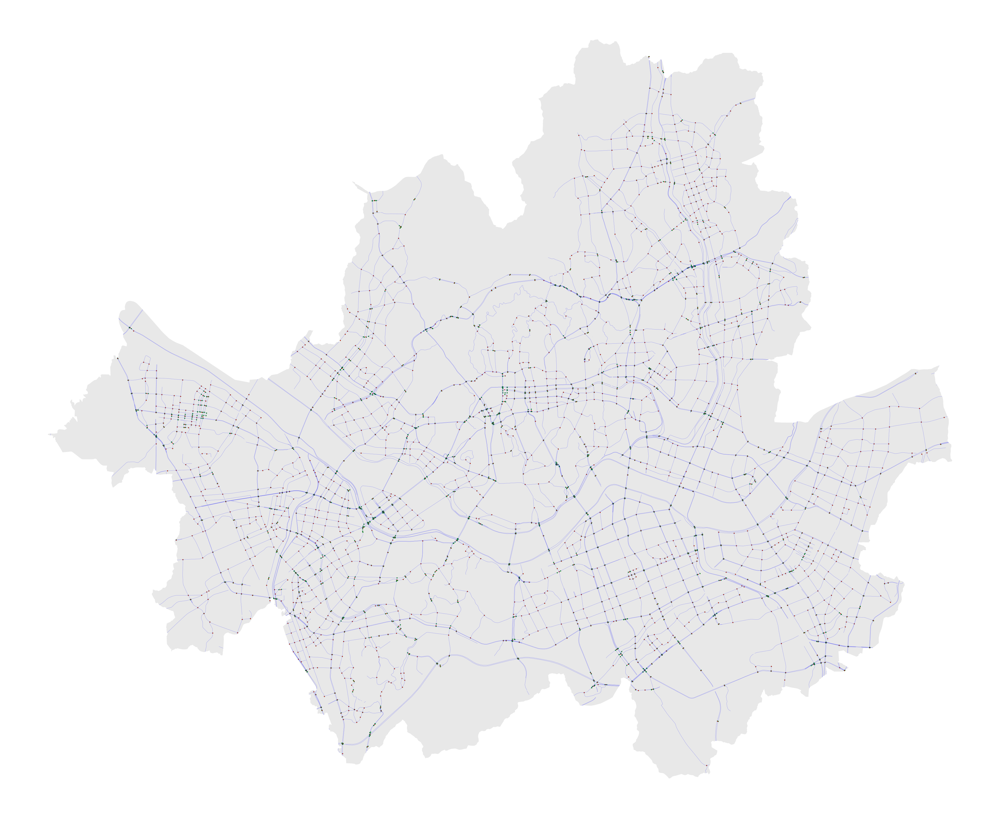

In [99]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(50, 50))
roads_merged.plot(ax=ax, color='blue', alpha=0.5, linewidth=0.4)
#intersections_buffered.plot(ax=ax, color='green', alpha=0.2)
seoul.plot(ax=ax, color='lightgrey', alpha=0.5)
#intersections_gdf.plot(ax=ax, color='red', markersize=2)

intersections_gdf.plot(ax=ax, color='green', markersize=3)
intersections_gdf_final.plot(ax=ax, color='red', markersize=2)
ax.set_axis_off()

plt.show()

In [ ]:
intersections_gdf_final.to_file(
    os.path.join(BASE_DIR, 'Data/GIS data/Intersections/intersections_cleaned.shp'),
    driver='ESRI Shapefile'
)

In [101]:
intersections_gdf['source'] = 'intersection'
stations['source'] = 'station'

all_points = pd.concat([intersections_gdf[['geometry', 'source']], stations[['geometry', 'source']]], ignore_index=True)
all_points = gpd.GeoDataFrame(all_points, geometry='geometry', crs=intersections_gdf.crs)

In [ ]:
coords = np.array([[p.x, p.y] for p in all_points.geometry])

# DBSCAN clustering
db = DBSCAN(eps=merge_buffer_m, min_samples=1).fit(coords)
all_points['group'] = db.labels_
# Group by cluster
grouped = all_points.groupby('group')

from shapely.geometry import MultiPoint

def weighted_centroid(group):
    coords = np.array([[geom.x, geom.y] for geom in group.geometry])
    sources = group['source'].values

    n_stations = np.sum(sources == 'station')
    n_intersections = np.sum(sources == 'intersection')

    # Assign weights
    weights = np.ones(len(group))
    if n_stations > 0 and n_intersections > 0:
        weight_factor = n_intersections / n_stations
        weights[sources == 'station'] = weight_factor
    # If only one type, weights stay 1

    # Compute weighted centroid
    weighted_x = np.average(coords[:, 0], weights=weights)
    weighted_y = np.average(coords[:, 1], weights=weights)

    return Point(weighted_x, weighted_y)

centroids = grouped.apply(weighted_centroid)

# Detect if group contains a station, intersection, or both
def get_type(types):
    unique = set(types)
    if unique == {'intersection'}:
        return 'intersection'
    elif unique == {'station'}:
        return 'station'
    else:
        return 'both'

types = grouped['source'].apply(get_type)

# Combine into one GeoDataFrame
intersections_stations_final = gpd.GeoDataFrame({'geometry': centroids, 'type': types}, crs=intersections_gdf.crs)
intersections_stations_final = intersections_stations_final.reset_index()

C:\Users\Michele\AppData\Local\Temp\ipykernel_9348\77295488.py:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  centroids = grouped.apply(weighted_centroid)


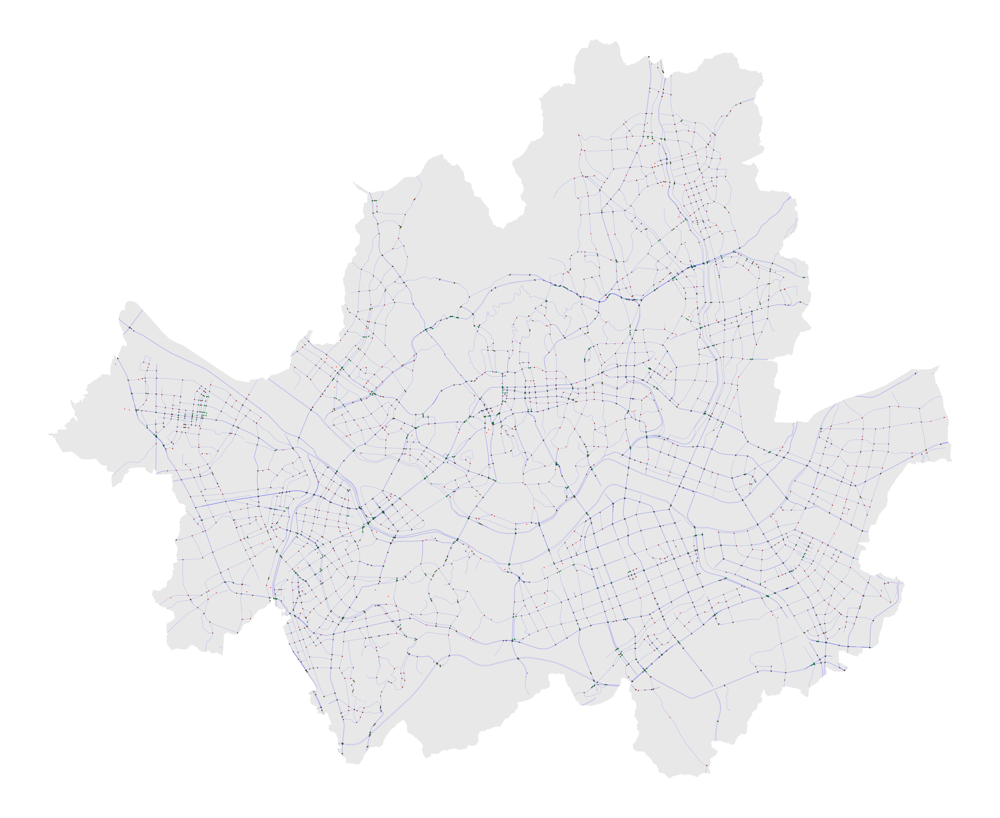

In [103]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(50, 50))
roads_merged.plot(ax=ax, color='blue', alpha=0.5, linewidth=0.4)
#intersections_buffered.plot(ax=ax, color='green', alpha=0.2)
seoul.plot(ax=ax, color='lightgrey', alpha=0.5)
#intersections_gdf.plot(ax=ax, color='red', markersize=2)

intersections_gdf.plot(ax=ax, color='green', markersize=3)
intersections_stations_final.plot(ax=ax, color='red', markersize=2)
ax.set_axis_off()


In [ ]:
intersections_stations_final.to_file(
    os.path.join(BASE_DIR, 'Data/GIS data/Intersections/intersections_stations.shp'),
    driver='ESRI Shapefile'
)

# Residential and Service Intersections

In [105]:
main_filter = road_filter
local_filter = ['residential', 'service']

roads_main = roads_full[roads_full['fclass'].isin(main_filter)].copy()
roads_local = roads_full[roads_full['fclass'].isin(local_filter)].copy()

roads_main_merged = roads_main.dissolve(by='name')
main_geoms = list(roads_main_merged.geometry)

# roads_local_merged = roads_local.dissolve(by='name')
local_geoms = list(roads_local.geometry)

from shapely.strtree import STRtree
main_tree = STRtree(main_geoms)


In [ ]:
# Collect intersections ONLY between local roads and main roads
residential_service_intersections = []

for local_geom in local_geoms:
    if local_geom is None or local_geom.is_empty:
        continue
    candidates = main_tree.query(local_geom)  # from main set
    for cand in candidates:
        cand_geom = main_geoms[cand]
        inter = local_geom.intersection(cand_geom)
        if inter.is_empty:
            continue
        if inter.geom_type == 'Point':
            residential_service_intersections.append(inter)
        elif inter.geom_type.startswith('Multi') or inter.geom_type == 'GeometryCollection':
            residential_service_intersections.extend(
                [g for g in inter.geoms if g.geom_type == 'Point']
            )

intersections_residential_raw = gpd.GeoDataFrame(geometry=residential_service_intersections, crs=roads_main_merged.crs)

In [115]:
if len(intersections_residential_raw) == 0:
    intersections_residential = intersections_residential_raw.copy()

else:
    # --- Cluster/average ONLY the new points (same DBSCAN radius) ---

    coords_new = np.array([[p.x, p.y] for p in intersections_residential_raw.geometry])
    db_new = DBSCAN(eps=merge_buffer_m, min_samples=1, metric='euclidean').fit(coords_new)
    intersections_residential_raw['group'] = db_new.labels_

    # dissolve to centroid of each new cluster
    grouped_new = intersections_residential_raw.dissolve(by='group')
    grouped_new['geometry'] = grouped_new.centroid
    new_cluster_centroids = grouped_new.reset_index()[['geometry']]
    new_cluster_centroids = gpd.GeoDataFrame(new_cluster_centroids, geometry='geometry', crs=intersections_residential_raw.crs)

    # --- Drop any new points that are too close to EXISTING nodes ---
    existing_pts = list(intersections_stations_final.geometry)
    if len(existing_pts) == 0:
        intersections_residential = new_cluster_centroids.copy()
    else:
        existing_tree = STRtree(existing_pts)

        # Keep only new centroids that are >= merge_buffer_m from any existing point
        keep_mask = []
        for pt in new_cluster_centroids.geometry:
            cands = existing_tree.query(pt, predicate='dwithin', distance=merge_buffer_m)
            if len(cands) == 0:
                keep_mask.append(True)
            else:
                keep_mask.append(False)

        intersections_residential = new_cluster_centroids[keep_mask].copy()
        intersections_residential.reset_index(drop=True, inplace=True)

if 'source' not in intersections_residential.columns:
    intersections_residential['source'] = 'local_intersection'



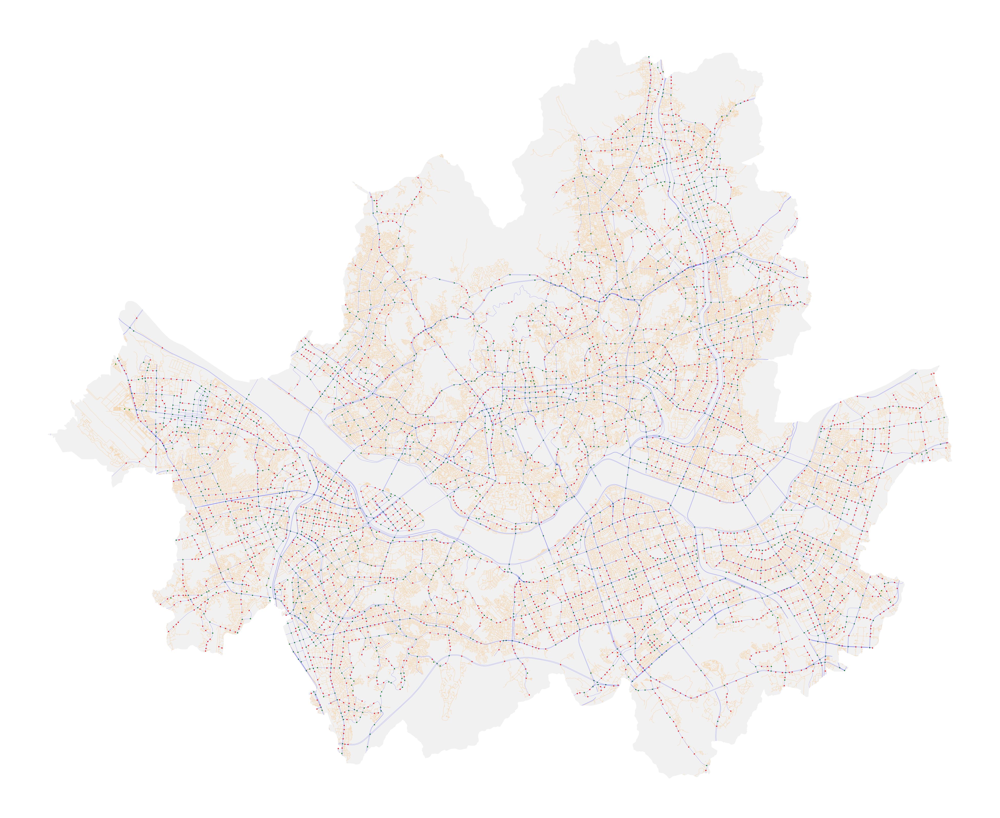

In [116]:

fig, ax = plt.subplots(figsize=(50, 50))
roads_main_merged.plot(ax=ax, color='blue', alpha=0.5, linewidth=0.4)
roads_local.plot(ax=ax, color='darkorange', alpha=0.5, linewidth=0.4)

seoul.plot(ax=ax, color='lightgrey', alpha=0.3)

intersections_stations_final.plot(ax=ax, color='green', markersize=5)
intersections_residential.plot(ax=ax, color='red', markersize=5)
ax.set_axis_off()


In [ ]:
# output intersections_residential and intersections_stations_final in one shp
intersections_combined = gpd.GeoDataFrame(pd.concat([intersections_residential, intersections_stations_final], ignore_index=True), crs=intersections_residential.crs)
intersections_combined.to_file(
    os.path.join(BASE_DIR, 'Data/GIS data/Intersections/intersections_combined.shp'),
    driver='ESRI Shapefile'
)